In [2]:
import cv2
import os
import math

# === User-defined parameters ===
video_path = "/media/kkondo/T7/dynus/tro_paper/yaw_optimization/figs/dgp_num_6_rate_01.mp4"  # Replace with the path to your MP4 file
output_folder = "/media/kkondo/T7/dynus/tro_paper/yaw_optimization/figs/num_6_frames"  # Replace with the desired output folder
extraction_freq = 2  # Frames per second to extract (2 Hz)

In [3]:
def generate_images(video_path, output_folder, extraction_freq):

    # Create the output folder if it does not exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise IOError(f"Cannot open video file: {video_path}")

    # Get video frames per second (fps)
    video_fps = cap.get(cv2.CAP_PROP_FPS)
    if video_fps <= 0:
        raise ValueError("Invalid FPS value obtained from the video.")

    # Calculate frame interval: every nth frame will be extracted
    # For example, if video is 30 FPS and we want 2 FPS, we extract every 15 frames.
    frame_interval = max(1, math.floor(video_fps / extraction_freq))
    print(f"Video FPS: {video_fps:.2f}, extracting every {frame_interval} frame(s) to get approximately {extraction_freq} FPS.")

    frame_count = 0  # Counter for total frames read
    saved_count = 0  # Counter for frames saved

    # Loop through the video frames
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # End of video
        
        # Save frame if current frame_count is a multiple of frame_interval
        if frame_count % frame_interval == 0:
            # Construct filename with a padded counter (e.g., frame_00001.jpg)
            frame_filename = os.path.join(output_folder, f"frame_{saved_count:05d}.jpg")
            cv2.imwrite(frame_filename, frame)
            saved_count += 1
        
        frame_count += 1

    # Release the video capture object
    cap.release()

    print(f"Extraction complete: {saved_count} frames saved to '{output_folder}'.")

In [4]:
# Generate images from the video
generate_images(video_path, output_folder, extraction_freq)

Video FPS: 15.00, extracting every 7 frame(s) to get approximately 2 FPS.
Extraction complete: 648 frames saved to '/media/kkondo/T7/dynus/tro_paper/yaw_optimization/figs/num_6_frames'.


In [6]:
SAVE = True

t_start = 124.93 # frame_00236.jpg
t1      = 149.16 # frame_00288.jpg
t2      = 161.80 # frame_00315.jpg
t3      = 199.13 # frame_00395.jpg
t4      = 210.30 # frame_00419.jpg
t5      = 244.38 # frame_00492.jpg

# Note that the video is recorded at 0.1 rate
t_start = t_start / 10.0
t1      = t1 / 10.0
t2      = t2 / 10.0
t3      = t3 / 10.0
t4      = t4 / 10.0
t5      = t5 / 10.0

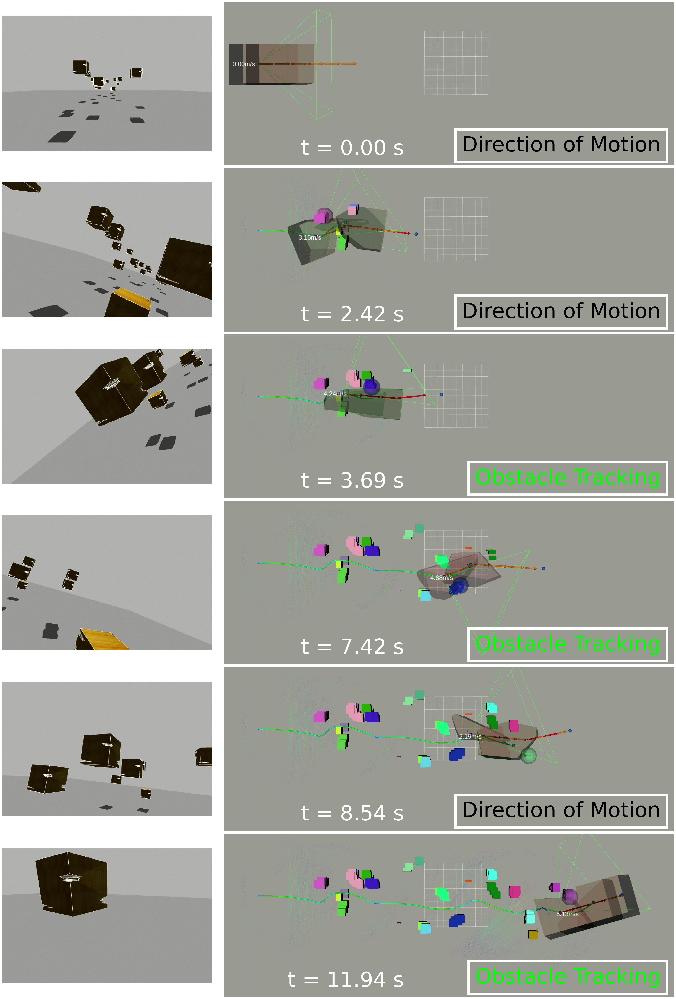

In [28]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Load images
t_start_image = plt.imread(output_folder + '/frame_00236.jpg')
t1_image = plt.imread(output_folder + '/frame_00288.jpg')
t2_image = plt.imread(output_folder + '/frame_00315.jpg')
t3_image = plt.imread(output_folder + '/frame_00395.jpg')
t4_image = plt.imread(output_folder + '/frame_00419.jpg')
t5_image = plt.imread(output_folder + '/frame_00492.jpg')

# Create a figure with GridSpec layout
fig_size_x = 38
fig_size_y = fig_size_x * 1.4
fig = plt.figure(figsize=(fig_size_x, fig_size_y))
gs = gridspec.GridSpec(6, 2, height_ratios=[1, 1, 1, 1, 1, 1], width_ratios=[1, 2.5])

# crop variables
camera_a = 900
camera_b = 200
camera_c = 10
camera_d = 1100

path_a = 800
path_b = 500
path_c = 1150
path_d = 430

# crop the images and create camera and actual path images from one image
t_start_camera_image = t_start_image[t_start_image.shape[0] - camera_a:t_start_image.shape[0] - camera_b, camera_c:camera_d]
t_start_path_image = t_start_image[path_a:t_start_image.shape[0]-path_b, path_c:t_start_image.shape[1] - path_d]
t1_camera_image = t1_image[t1_image.shape[0] - camera_a:t1_image.shape[0] - camera_b, camera_c:camera_d]
t1_path_image = t1_image[path_a:t1_image.shape[0]-path_b, path_c:t1_image.shape[1] - path_d]
t2_camera_image = t2_image[t2_image.shape[0] - camera_a:t2_image.shape[0] - camera_b, camera_c:camera_d]
t2_path_image = t2_image[path_a:t2_image.shape[0]-path_b, path_c:t2_image.shape[1] - path_d]
t3_camera_image = t3_image[t3_image.shape[0] - camera_a:t3_image.shape[0] - camera_b, camera_c:camera_d]
t3_path_image = t3_image[path_a:t3_image.shape[0]-path_b, path_c:t3_image.shape[1] - path_d]
t4_camera_image = t4_image[t4_image.shape[0] - camera_a:t4_image.shape[0] - camera_b, camera_c:camera_d]
t4_path_image = t4_image[path_a:t4_image.shape[0]-path_b, path_c:t4_image.shape[1] - path_d]
t5_camera_image = t5_image[t5_image.shape[0] - camera_a:t5_image.shape[0] - camera_b, camera_c:camera_d]
t5_path_image = t5_image[path_a:t5_image.shape[0]-path_b, path_c:t5_image.shape[1] - path_d]

# Start: t_start camera image
ax_t_start_camera = fig.add_subplot(gs[0, 0])
ax_t_start_camera.imshow(t_start_camera_image)
ax_t_start_camera.axis('off')

# First: t_start path image
ax_t_start_path = fig.add_subplot(gs[0, 1])
ax_t_start_path.imshow(t_start_path_image)
ax_t_start_path.axis('off')
ax_t_start_path.text(0.4, 0.1, f't = {t_start - t_start:.2f} s', ha='right', va='center', transform=ax_t_start_path.transAxes, fontsize=80, color='white')
ax_t_start_path.text(0.97, 0.12, 'Direction of Motion', 
                     ha='right', va='center', transform=ax_t_start_path.transAxes, 
                     fontsize=80, color='black',
                     bbox=dict(facecolor='none', edgecolor='white', linewidth=10, boxstyle='square'))


# First: t1 camera image
ax_t1_camera = fig.add_subplot(gs[1, 0])
ax_t1_camera.imshow(t1_camera_image)
ax_t1_camera.axis('off')

# Second: t1 path image
ax_t1_path = fig.add_subplot(gs[1, 1])
ax_t1_path.imshow(t1_path_image)
ax_t1_path.axis('off')
ax_t1_path.text(0.4, 0.1, f't = {t1 - t_start:.2f} s', ha='right', va='center', transform=ax_t1_path.transAxes, fontsize=80, color='white')
ax_t1_path.text(0.97, 0.12, 'Direction of Motion', 
                     ha='right', va='center', transform=ax_t1_path.transAxes, 
                     fontsize=80, color='black',
                     bbox=dict(facecolor='none', edgecolor='white', linewidth=10, boxstyle='square'))

# Third: t2 camera image
ax_t2_camera = fig.add_subplot(gs[2, 0])
ax_t2_camera.imshow(t2_camera_image)
ax_t2_camera.axis('off')

# Fourth: t2 path image
ax_t2_path = fig.add_subplot(gs[2, 1])
ax_t2_path.imshow(t2_path_image)
ax_t2_path.axis('off')
ax_t2_path.text(0.4, 0.1, f't = {t2 - t_start:.2f} s', ha='right', va='center', transform=ax_t2_path.transAxes, fontsize=80, color='white')
ax_t2_path.text(0.97, 0.12, 'Obstacle Tracking', 
                     ha='right', va='center', transform=ax_t2_path.transAxes, 
                     fontsize=80, color='lime',
                     bbox=dict(facecolor='none', edgecolor='white', linewidth=10, boxstyle='square'))

# Fifth: t3 camera image
ax_t3_camera = fig.add_subplot(gs[3, 0])
ax_t3_camera.imshow(t3_camera_image)
ax_t3_camera.axis('off')

# Sixth: t3 path image
ax_t3_path = fig.add_subplot(gs[3, 1])
ax_t3_path.imshow(t3_path_image)
ax_t3_path.axis('off')
ax_t3_path.text(0.4, 0.1, f't = {t3 - t_start:.2f} s', ha='right', va='center', transform=ax_t3_path.transAxes, fontsize=80, color='white')
ax_t3_path.text(0.97, 0.12, 'Obstacle Tracking', 
                     ha='right', va='center', transform=ax_t3_path.transAxes, 
                     fontsize=80, color='lime',
                     bbox=dict(facecolor='none', edgecolor='white', linewidth=10, boxstyle='square'))

# Seventh: t4 camera image
ax_t4_camera = fig.add_subplot(gs[4, 0])
ax_t4_camera.imshow(t4_camera_image)
ax_t4_camera.axis('off')

# Eighth: t4 path image
ax_t4_path = fig.add_subplot(gs[4, 1])
ax_t4_path.imshow(t4_path_image)
ax_t4_path.axis('off')
ax_t4_path.text(0.4, 0.1, f't = {t4 - t_start:.2f} s', ha='right', va='center', transform=ax_t4_path.transAxes, fontsize=80, color='white')
ax_t4_path.text(0.97, 0.12, 'Direction of Motion',  
                     ha='right', va='center', transform=ax_t4_path.transAxes, 
                     fontsize=80, color='black',
                     bbox=dict(facecolor='none', edgecolor='white', linewidth=10, boxstyle='square'))

# Ninth: t5 camera image
ax_t5_camera = fig.add_subplot(gs[5, 0])
ax_t5_camera.imshow(t5_camera_image)
ax_t5_camera.axis('off')

# Tenth: t5 path image
ax_t5_path = fig.add_subplot(gs[5, 1])
ax_t5_path.imshow(t5_path_image)
ax_t5_path.axis('off')
ax_t5_path.text(0.4, 0.1, f't = {t5 - t_start:.2f} s', ha='right', va='center', transform=ax_t5_path.transAxes, fontsize=80, color='white')
ax_t5_path.text(0.97, 0.12, 'Obstacle Tracking', 
                     ha='right', va='center', transform=ax_t5_path.transAxes, 
                     fontsize=80, color='lime',
                     bbox=dict(facecolor='none', edgecolor='white', linewidth=10, boxstyle='square'))

plt.tight_layout()
# plt.show()

# save the figure
# if SAVE:
plt.savefig(output_folder + "/num_6_combined.png", bbox_inches='tight')
# plt.savefig("/home/kkondo/paper_writing/DYNUS_paper/figures/sim/yaw_optimization/success/num_1_combined.png", bbox_inches='tight')

In [2]:
import cv2
import numpy as np
import os
import math

# -------------------------
# User-defined parameters
# -------------------------
video_path = "/media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/yaw_optimization_gazebo.mp4"  # Replace with your video file path
output_folder = "/media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/gazebo_images"          # Folder to save composite images
alpha = 0.01  # Blending factor (0 < alpha <= 1): higher means less transparent overlay

# Create output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# -------------------------
# Open the video file
# -------------------------
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    raise IOError(f"Cannot open video file: {video_path}")

# Retrieve video properties
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Video FPS: {fps:.2f}, Total Frames: {total_frames}")

# Divide the video into 3 equal segments
quarter_frames = total_frames // 3

def create_composite_iterative(start_frame, end_frame, alpha):
    """
    Create a composite image by iteratively blending frames from start_frame to end_frame.
    Each new frame is blended into the composite with factor alpha.
    """
    # Jump to the starting frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    composite = None
    frame_count = 0
    
    for frame_idx in range(start_frame, end_frame):
        ret, frame = cap.read()
        if not ret:
            break  # End of video or error
        frame = frame.astype(np.float32)
        if composite is None:
            composite = frame
        else:
            # Blend: composite = composite*(1 - alpha) + frame*alpha
            composite = composite * (1 - alpha) + frame * alpha
        frame_count += 1

    if composite is not None:
        composite = np.clip(composite, 0, 255).astype(np.uint8)
    return composite, frame_count

# Process each quarter
for i in range(3):
    start = i * quarter_frames
    # For the last quarter, include any leftover frames
    end = total_frames if i == 3 else (i+1) * quarter_frames
    composite_img, count = create_composite_iterative(start, end, alpha)
    
    # Calculate time duration (in seconds) for this quarter
    start_time = start / fps
    end_time = end / fps
    duration = end_time - start_time
    print(f"Segment {i+1}: Start time = {start_time:.2f}s, End time = {end_time:.2f}s, Duration = {duration:.2f}s, Frames used = {count}")
    
    # Annotate the composite image with the time duration
    if composite_img is not None:
        annotation_text = f"{start_time:.2f}s - {end_time:.2f}s"
        # Place the annotation in the bottom-left corner; adjust font scale/thickness as needed.
        cv2.putText(composite_img, annotation_text, (30, composite_img.shape[0] - 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 4, cv2.LINE_AA)
        output_filename = os.path.join(output_folder, f"segment_{i+1}.jpg")
        cv2.imwrite(output_filename, composite_img)
        print(f"Saved composite image for quarter {i+1} to {output_filename}")

# Release the video capture object
cap.release()


Video FPS: 15.00, Total Frames: 363
Quarter 1: Start time = 0.00s, End time = 8.07s, Duration = 8.07s, Frames used = 121
Saved composite image for quarter 1 to /media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/gazebo_images/segment_1.jpg
Quarter 2: Start time = 8.07s, End time = 16.13s, Duration = 8.07s, Frames used = 121
Saved composite image for quarter 2 to /media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/gazebo_images/segment_2.jpg
Quarter 3: Start time = 16.13s, End time = 24.20s, Duration = 8.07s, Frames used = 121
Saved composite image for quarter 3 to /media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/gazebo_images/segment_3.jpg


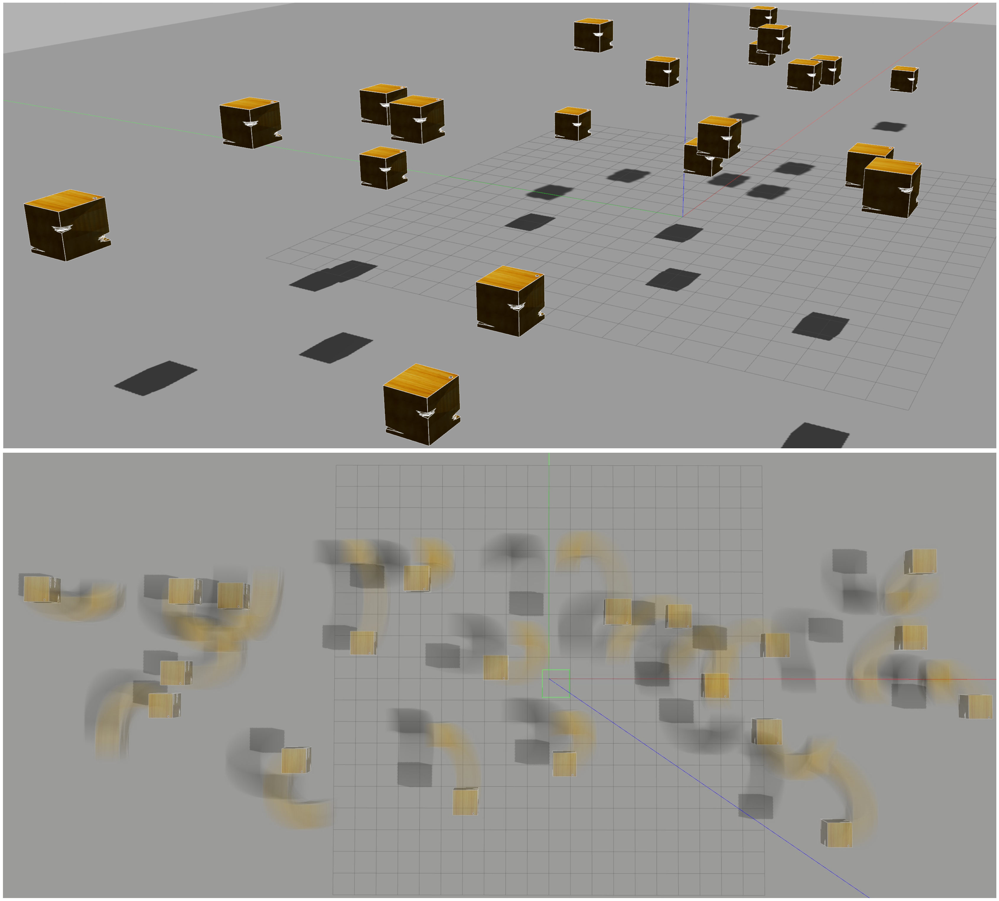

In [17]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Load images
folder_path = "/media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/gazebo_images"
gazebo_image = plt.imread(folder_path + '/yaw_optimization_gazebo.png')
transparent_image = plt.imread(folder_path + '/segment_1.jpg')

# Create a figure with GridSpec layout
fig_size_x = 36
fig_size_y = fig_size_x * 0.85
fig = plt.figure(figsize=(fig_size_x, fig_size_y))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1])

# crop the images and create camera and actual path images from one image
gazebo_image = gazebo_image[600:gazebo_image.shape[0]-300, 400:gazebo_image.shape[1]-600]
transparent_image = transparent_image[500:transparent_image.shape[0]-220, 400:transparent_image.shape[1]-300]

# Just plot cropped image
ax_gazebo = fig.add_subplot(gs[0, 0])
ax_gazebo.imshow(gazebo_image)
ax_gazebo.axis('off')

# Transparent overlay image
ax_transparent = fig.add_subplot(gs[1, 0])
ax_transparent.imshow(transparent_image)
ax_transparent.axis('off')

plt.tight_layout()
# plt.show()

# Save the figure if SAVE is True
plt.savefig("/media/kkondo/T7/dynus/tro_paper/yaw_optimization/success/gazebo_images/gazebo.png", bbox_inches='tight')
plt.savefig("/home/kkondo/paper_writing/DYNUS_paper/figures/sim/yaw_optimization/gazebo.png", bbox_inches='tight')